# Decision Tree

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# To enable plotly plot in Google Colab
# https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory/47230966
def configure_plotly_browser_state():
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
    
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

In [3]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
configure_plotly_browser_state()
init_notebook_mode(connected=False)



In [4]:
data = pd.read_csv('/content/drive/My Drive/Applied AI/Datasets/New Donors/Preprocessed_inc_others.csv')
data.head()

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179
2,2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00,soccer equipment awesome middle school students,22,0.313000,6,116
3,3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04,techie kindergarteners,4,0.123264,2,127
4,4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74,interactive math tools,4,0.160651,3,114


In [5]:
data.describe()

,Unnamed: 0,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,sentiment_score,No of words in project title,No of words in essay
count,109248.000000,109248.000000,109248.000000,109248.000000,109248.000000,109248.000000,109248.000000,109248.000000
mean,54623.500000,11.153165,0.848583,298.119343,16.965610,0.210069,4.329754,151.406369
std,31537.325441,27.777154,0.358456,367.498030,26.182942,0.083568,1.779834,38.986772
min,0.000000,0.000000,0.000000,0.660000,1.000000,-0.189744,1.000000,76.000000
25%,27311.750000,0.000000,1.000000,104.310000,4.000000,0.154350,3.000000,121.000000
50%,54623.500000,2.000000,1.000000,206.220000,9.000000,0.208285,4.000000,141.000000
75%,81935.250000,9.000000,1.000000,379.000000,21.000000,0.264347,5.000000,172.000000
max,109247.000000,451.000000,1.000000,9999.000000,930.000000,0.663333,18.000000,339.000000


In [6]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)
X.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179


In [7]:
y = y.reshape(-1,1)
print(y.shape)

(109248, 1)


### Splitting the data

In [0]:
from sklearn.model_selection import train_test_split
data_train, data_test, label_train, label_test = train_test_split(X, y, test_size=0.33, stratify=y, random_state=42)

In [9]:
print(data_train.shape)
print(data_test.shape)
print(label_train.shape)
print(label_test.shape)

(73196, 14)
(36052, 14)
(73196, 1)
(36052, 1)


In [0]:
X_train = data_train
X_test = data_test
y_train = label_train
y_test = label_test

In [11]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(73196, 14)
(36052, 14)
(73196, 1)
(36052, 1)


## 1.Vectorizing Features

### 1.1 School State

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_1 = CountVectorizer(list(X_train['school_state'].values), lowercase=False, binary=True)

In [0]:
X_train_Sstate = vectorizer_1.fit_transform(X_train['school_state'].values)
X_test_Sstate = vectorizer_1.transform(X_test['school_state'].values)

In [14]:
print(X_train_Sstate.shape)
print(X_test_Sstate.shape)

(73196, 51)
(36052, 51)


### 1.2 Clean Categories

In [0]:
vectorizer_2 = CountVectorizer(list(X_train['clean_categories'].values), lowercase=False, binary=True)

In [0]:
X_train_cat = vectorizer_2.fit_transform(X_train['clean_categories'].values)
X_test_cat = vectorizer_2.transform(X_test['clean_categories'].values)

In [17]:
print(X_train_cat.shape)
print(X_test_cat.shape)

(73196, 9)
(36052, 9)


### 1.3 Clean sub categories

In [0]:
vectorizer_3 = CountVectorizer(list(X_train['clean_subcategories'].values), lowercase=False, binary=True)

In [0]:
X_train_subcat = vectorizer_3.fit_transform(X_train['clean_subcategories'].values)
X_test_subcat = vectorizer_3.transform(X_test['clean_subcategories'].values)

In [20]:
print(X_train_subcat.shape)
print(X_test_subcat.shape)

(73196, 30)
(36052, 30)


### 1.4 Project Grade Category

In [0]:
vectorizer_4 = CountVectorizer(list(X_train['project_grade_category'].values), lowercase=False, binary=True)

In [0]:
X_train_grade = vectorizer_4.fit_transform(X_train['project_grade_category'].values)
X_test_grade = vectorizer_4.transform(X_test['project_grade_category'].values)

In [23]:
print(X_train_grade.shape)
print(X_test_grade.shape)

(73196, 4)
(36052, 4)


### 1.5 Teacher Prefix

In [0]:
vectorizer_5 = CountVectorizer(list(X_train['teacher_prefix'].values), lowercase=False, binary=True)

In [0]:
X_train_prefix = vectorizer_5.fit_transform(X_train['teacher_prefix'].values)
X_test_prefix = vectorizer_5.transform(X_test['teacher_prefix'].values)

In [26]:
print(X_train_prefix.shape)
print(X_test_prefix.shape)

(73196, 5)
(36052, 5)


### 1.6 Essay

#### 1.6.1 TFIDF

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_7 = TfidfVectorizer(list(X_train['essay'].values), min_df=10, max_features=5000, ngram_range=(2,2))

In [0]:
X_train_essay_tfidf = vectorizer_7.fit_transform(X_train['essay'].values)
X_test_essay_tfidf = vectorizer_7.transform(X_test['essay'].values)

In [29]:
print(X_train_essay_tfidf.shape)
print(X_test_essay_tfidf.shape)

(73196, 5000)
(36052, 5000)


#### 1.6.2 TFIDF W2V

In [0]:
#Unpickling
import pickle
with open('/content/drive/My Drive/Applied AI/Datasets/New Donors/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words = set(model.keys())

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
Tfidf_model_essay = TfidfVectorizer()
Tfidf_model_essay.fit(X_train['essay'])
dictionary_essay = dict(zip(Tfidf_model_essay.get_feature_names(), Tfidf_model_essay.idf_))
tf_idf_words_essay = set(Tfidf_model_essay.get_feature_names())            

In [32]:
from tqdm import tqdm

X_train_essay_tfidf_w2v = []
for sentence in tqdm(X_train['essay']):
    vector = np.zeros(300)
    tf_idf_weight = 0
    for word in sentence.split():
        if (word in glove_words) and (word in tf_idf_words_essay):
            vec = model[word] #w2v
            tf_idf = dictionary_essay[word]*(sentence.count(word)/len(sentence.split())) #tfidf
            vector += (vec*tf_idf) #TFIDF W2V
            tf_idf_weight += tf_idf
            
    if tf_idf_weight != 0:
            vector /= tf_idf_weight  #tfidf weight w2v
    X_train_essay_tfidf_w2v.append(vector)

100%|██████████| 73196/73196 [02:23<00:00, 511.45it/s]


In [33]:
X_test_essay_tfidf_w2v = []

for sentence in tqdm(X_test['essay']):
    vector = np.zeros(300)
    tfidf_weight = 0
    for word in sentence.split():
        if (word in glove_words) and (word in tf_idf_words_essay):
            vec = model[word]     #w2v
            tf_idf = dictionary_essay[word]*(sentence.count(word)/len(sentence.split())) #tfidf
            vector += (vec*tf_idf) #tfidf_w2v
            tfidf_weight += tf_idf #tf_idf_weight
            
    if tfidf_weight !=0:
        vector /= tfidf_weight
    X_test_essay_tfidf_w2v.append(vector)
            

100%|██████████| 36052/36052 [01:09<00:00, 521.34it/s]


In [34]:
print(len(X_train_essay_tfidf_w2v))
print(len(X_test_essay_tfidf_w2v))

73196
36052


### 1.7 Title

#### 1.7.1 TFIDF 

In [0]:
vectorizer_9 = TfidfVectorizer(list(X_train['title'].values), min_df=10)

In [0]:
X_train_title_tfidf = vectorizer_9.fit_transform(X_train['title'].values)
X_test_title_tfidf = vectorizer_9.transform(X_test['title'].values)

In [37]:
print(X_train_title_tfidf.shape)
print(X_test_title_tfidf.shape)

(73196, 2617)
(36052, 2617)


#### 1.7.2 TFIDF W2V

In [0]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['title'])
dictionary_title  = dict(zip(tfidf_model.get_feature_names(), tfidf_model.idf_))
tf_idf_words_title = set(tfidf_model.get_feature_names())

In [39]:
X_train_title_tfidf_w2v = []

for sentence in tqdm(X_train['title']):
    vector = np.zeros(300)
    tfidf_weight = 0
    for word in sentence.split():
        if (word in glove_words) and (word in tf_idf_words_title):
            vec = model[word]      #W2V
            tf_idf = dictionary_title[word] * (sentence.count(word)/len(sentence.split()))   #tfidf
            vector += (vec*tf_idf) #tfidf W2V
            tfidf_weight += tf_idf #weighted tfidf
            
    if tfidf_weight != 0:
        vector /= tfidf_weight
        
    X_train_title_tfidf_w2v.append(vector)

100%|██████████| 73196/73196 [00:02<00:00, 26670.37it/s]


In [40]:
X_test_title_tfidf_w2v = []

for sentence in tqdm(X_test['title']):
    vector = np.zeros(300)
    tfidf_weight = 0
    for word in sentence.split():
        if (word in glove_words) and (word in tf_idf_words_title):
            vec = model[word]  #W2V
            tf_idf = dictionary_title[word]*(sentence.count(word)/len(sentence.split())) #tfidf
            vector +=  (vec*tf_idf)
            tfidf_weight += tf_idf
            
    if tfidf_weight != 0:
        vector /= tfidf_weight
    
    X_test_title_tfidf_w2v.append(vector)

100%|██████████| 36052/36052 [00:01<00:00, 32170.07it/s]


In [41]:
print(len(X_train_title_tfidf_w2v))
print(len(X_test_title_tfidf_w2v))

73196
36052


### 1.8 Price

#### 1.8.1 Unstandardized

In [0]:
X_train_price_unstandardized = X_train['price'].values.reshape(-1,1)
X_test_price_unstandardized = X_test['price'].values.reshape(-1,1)

In [43]:
print(X_train_price_unstandardized.shape)
print(X_test_price_unstandardized.shape)

(73196, 1)
(36052, 1)


#### 1.8.2 Standardized

In [0]:
from sklearn.preprocessing import StandardScaler
sc_price = StandardScaler()
X_train_price = sc_price.fit_transform(X_train['price'].values.reshape(-1,1))
X_test_price = sc_price.transform(X_test['price'].values.reshape(-1,1))

In [45]:
print(X_train_price.shape)
print(X_test_price.shape)

(73196, 1)
(36052, 1)


### 1.9 Previously Posted projects

#### 1.9.1 Unstandardized

In [0]:
X_train_previous_unstandardized = X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
X_test_previous_unstandardized = X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)

In [47]:
print(X_train_previous_unstandardized.shape)
print(X_test_previous_unstandardized.shape)

(73196, 1)
(36052, 1)


#### 1.9.2 Standardized

In [0]:
from sklearn.preprocessing import StandardScaler
sc_previous = StandardScaler()
X_train_previous = sc_previous.fit_transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_previous = sc_previous.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

In [49]:
print(X_train_previous.shape)
print(X_test_previous.shape)

(73196, 1)
(36052, 1)


## 2. Set-1

In [50]:
print(X_train_Sstate.shape)
print(X_train_cat.shape)
print(X_train_subcat.shape)
print(X_train_grade.shape)
print(X_train_prefix.shape)
print(X_train_price.shape)
print(X_train_previous.shape)
print(X_train_essay_tfidf.shape)
print(X_train_title_tfidf.shape)
print(len(X_train_essay_tfidf_w2v))
print(len(X_train_title_tfidf_w2v))

print('='*50)
print(X_test_Sstate.shape)
print(X_test_cat.shape)
print(X_test_subcat.shape)
print(X_test_grade.shape)
print(X_test_prefix.shape)
print(X_test_price.shape)
print(X_test_previous.shape)
print(X_test_essay_tfidf.shape)
print(X_test_title_tfidf.shape)
print(len(X_test_essay_tfidf_w2v))
print(len(X_test_title_tfidf_w2v))

(73196, 51)
(73196, 9)
(73196, 30)
(73196, 4)
(73196, 5)
(73196, 1)
(73196, 1)
(73196, 5000)
(73196, 2617)
73196
73196
(36052, 51)
(36052, 9)
(36052, 30)
(36052, 4)
(36052, 5)
(36052, 1)
(36052, 1)
(36052, 5000)
(36052, 2617)
36052
36052


### 2.1 Merging all the features

In [0]:
from scipy.sparse import hstack
X_train_1 = hstack((X_train_Sstate, X_train_cat, X_train_subcat, X_train_grade, X_train_prefix, X_train_price, X_train_previous, 
                   X_train_essay_tfidf, X_train_title_tfidf)).tocsr()

X_test_1 = hstack((X_test_Sstate, X_test_cat, X_test_subcat, X_test_grade, X_test_prefix, X_test_price, X_test_previous,
                  X_test_essay_tfidf, X_test_title_tfidf)).tocsr()

In [55]:
print(X_train_1.shape)
print(X_test_1.shape)

(73196, 7718)
(36052, 7718)


### 2.2 Grid Search

In [0]:
from sklearn.tree import DecisionTreeClassifier
classifier_1 = DecisionTreeClassifier()

In [0]:
from sklearn.model_selection import GridSearchCV
parameters = [
                { 
                    'max_depth' : [1, 5, 10, 50],
                    'min_samples_split' : [5, 10, 100, 500]
                }
            ]
grid_search_1 = GridSearchCV(estimator=classifier_1, param_grid=parameters, cv=2, scoring='roc_auc', n_jobs=-1, return_train_score=True)

In [0]:
grid_search_1 = grid_search_1.fit(X_train_1, y_train)

In [60]:
results = pd.DataFrame(grid_search_1.cv_results_)
results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,0.462417,0.002201,0.037580,0.000910,1,5,"{'max_depth': 1, 'min_samples_split': 5}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
1,0.410764,0.001503,0.035645,0.000656,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
2,0.415946,0.000691,0.037254,0.000756,1,100,"{'max_depth': 1, 'min_samples_split': 100}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
3,0.416456,0.000415,0.036626,0.000772,1,500,"{'max_depth': 1, 'min_samples_split': 500}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
4,1.965743,0.019080,0.038134,0.000024,5,5,"{'max_depth': 5, 'min_samples_split': 5}",0.617550,0.617296,0.617423,0.000127,4,0.631318,0.631141,0.631229,0.000089


### 2.3 AUC vs Hyperparameter

In [0]:
min_split_1 = results['param_min_samples_split']
max_depth_1 = results['param_max_depth']
auc_train_1 = results['mean_train_score']
auc_test_1 = results['mean_test_score']

In [62]:
min_split_1

0       5
1      10
2     100
3     500
4       5
5      10
6     100
7     500
8       5
9      10
10    100
11    500
12      5
13     10
14    100
15    500
Name: param_min_samples_split, dtype: object

In [0]:
#To plot this into plotly it should be in list
min_split_1 = min_split_1.to_list()
max_depth_1 = max_depth_1.to_list()
auc_test_1 = auc_test_1.to_list()
auc_train_1 = auc_train_1.to_list()

In [89]:
#To enable plotly plot in this cell
enable_plotly_in_cell() 

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=min_split_1, y=max_depth_1, z=auc_train_1, name='training')
trace2 = go.Scatter3d(x=min_split_1, y=max_depth_1, z=auc_test_1, name='Testing')
data = [trace1, trace2]

layout = go.Layout(
                    scene=dict(
                                xaxis = dict(title='Min Sample Split'),
                                yaxis = dict(title='Max Depth'),
                                zaxis = dict(title='AUC'),
                                )
                    )
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='3d-scatter-colorscale')

### Note:
    - I trained this model in Google Colab and pltoly plot is not showing in Jupyter notebook once it is downloaded as .ipynb. So i took a screen shot of the plot and paste it in the next cell

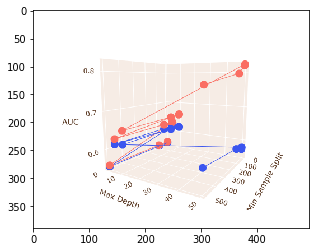

In [7]:
import matplotlib.pyplot as plt
import cv2
img_1 = cv2.imread(r'C:\Users\prem.k\Desktop\My projects\Assign\DT\plot_1.PNG')
plt.imshow(img_1)

In [84]:
best_depth_1 = grid_search_1.best_params_['max_depth']
best_min_split_1 = grid_search_1.best_params_['min_samples_split']
print('Best Depth :', best_depth_1)
print('Best Min split :', best_min_split_1)

Best Depth : 10
Best Min split : 500


In [0]:
best_depth = 10
best_min_split = 500

### Summary:
    - It shows that the best parameters after grid search is best depth = 10, best min split=500

### 2.4 Modelling With best parameters

In [54]:
from sklearn.tree import DecisionTreeClassifier
classifier_withParam_1 = DecisionTreeClassifier(max_depth=best_depth_1, min_samples_split=best_min_split1)
classifier_withParam_1.fit(X_train_1, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### 2.5 Cross Validation

In [86]:
from sklearn.model_selection import cross_val_score
cv_1 = cross_val_score(estimator=classifier_withParam_1, X=X_train_1, y=y_train, cv=5, scoring='roc_auc')

In [90]:
best_auc_1 = cv_1.mean()
print('Best AUC: %4f' %best_auc_1)

Best AUC: 0.627485


### 2.6 HyperParameter vs AUC

In [0]:
def batch_predict(clf, data):
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])

    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
        
    return y_data_pred

In [0]:
y_train_predproba_1 = batch_predict(classifier_withParam_1, X_train_1)
y_test_predproba_1 = batch_predict(classifier_withParam_1, X_test_1)

In [0]:
from sklearn.metrics import roc_curve, auc
train_fpr_1, train_tpr_1, train_threshold_1 = roc_curve(y_train, y_train_predproba_1)
test_fpr_1, test_tpr_1, test_threshold_1 = roc_curve(y_test, y_test_predproba_1)

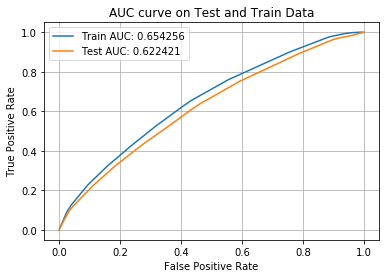

In [94]:
plt.plot(train_fpr_1, train_tpr_1, label='Train AUC: %4f' %auc(train_fpr_1, train_tpr_1))
plt.plot(test_fpr_1,  test_tpr_1, label='Test AUC: %4f' %auc(test_fpr_1, test_tpr_1))

plt.title('AUC curve on Test and Train Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.legend()
plt.show()

### 2.7 Confusion Matrix

In [0]:
def find_best_threshold(fpr, tpr, threshold):
    t = threshold[np.argmax(tpr*(1-fpr))]
    print('the maximum tpr*(1-fpr) is :', max(tpr*(1-fpr)), 'for threshold', np.round(t,3))
    return t

In [58]:
best_t = find_best_threshold(train_fpr_1, train_tpr_1, train_threshold_1)

the maximum tpr*(1-fpr) is : 0.3715603142057951 for threshold 0.864


In [0]:
def predict_with_threshold(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
            
    return predictions

In [0]:
y_train_pred_1 = predict_with_threshold(y_train_predproba_1, best_t)
y_test_pred_1 = predict_with_threshold(y_test_predproba_1, best_t)

In [115]:
from sklearn.metrics import confusion_matrix

cm_train_1 = confusion_matrix(y_train, y_train_pred_1)
cm_test_1 = confusion_matrix(y_test, y_test_pred_1)

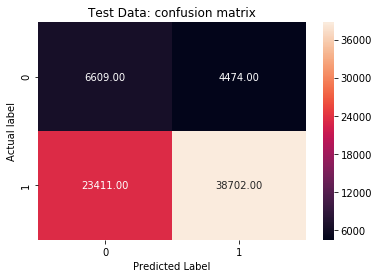

In [116]:
sns.heatmap(cm_train_1, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

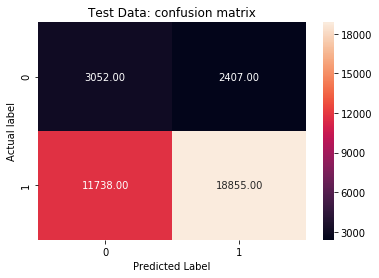

In [117]:
sns.heatmap(cm_test_1, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

### 2.8 Getting False positive Points in Test data

#### Note :
  - In order to take false positive points in test data we need y_pred without probability values

In [86]:
type(y_test)

numpy.ndarray

In [87]:
type(y_test_pred_1)

list

#### Note:
  - Since we can see that y_test in numpy array type and y_test_pred_1 is in list type and we have to convert the list to numpy array to find the false positive points in test data

In [0]:
y_test_pred_1 = (np.array(y_test_pred_1)).reshape(-1,1)

In [69]:
print(y_test.shape)
print(y_test_pred_1.shape)

(36052, 1)
(36052, 1)


In [0]:
#Getting the False positive points in test data
test_1_FP = data_test[(y_test_pred_1==1) & (y_test==0)]

In [81]:
test_1_FP.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
69487,69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,this is my ukulele dream,2,0.029133,5,124
90598,90598,ca,mr,grades_3_5,2,literacy_language specialneeds,literacy specialneeds,my students diverse enthusiastic learners they...,175.98,technology everyone,8,0.376778,2,113


In [82]:
test_1_FP.shape

(2407, 14)

#### Note:
  - We can see that the 2407 False positive data points in Test data

### 2.9 Plotting the Word Cloud 

In [83]:
test_1_FP.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
69487,69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,this is my ukulele dream,2,0.029133,5,124
90598,90598,ca,mr,grades_3_5,2,literacy_language specialneeds,literacy specialneeds,my students diverse enthusiastic learners they...,175.98,technology everyone,8,0.376778,2,113


In [0]:
#https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud, STOPWORDS

In [0]:
comment_words = ''
stopwords = set(STOPWORDS)

In [0]:
for val in test_1_FP['essay']:
  val = str(val)
  tokens = val.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()

  for word in tokens:
    comment_words = comment_words + word + ' '

#Generating Word Cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=stopwords, min_font_size=10).generate(comment_words)

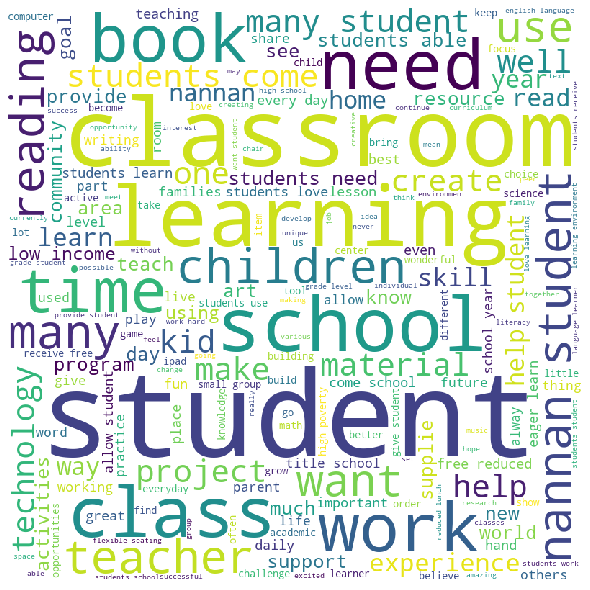

In [88]:
#plotting the Word Cloud
plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### 2.10 Plot Box Plot

Text(0.5, 1.0, 'Price on False Positive points')

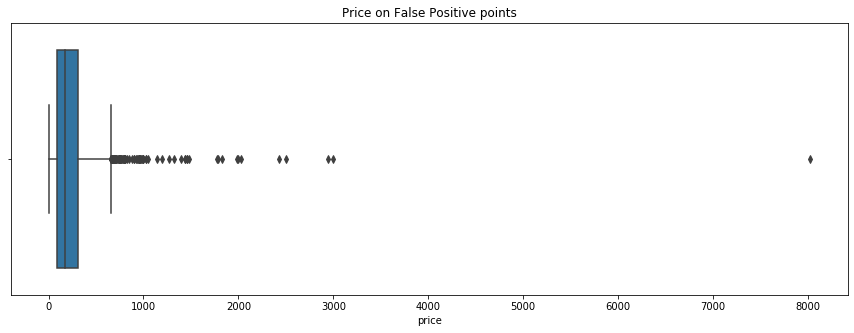

In [95]:
plt.figure(figsize=(15,5))
sns.boxplot(x='price',  data=test_FP)
plt.title('Price on False Positive points')

### 2.11 Plotting PDF for Teacher Previously approved projects on False positive points

<Figure size 504x720 with 0 Axes>

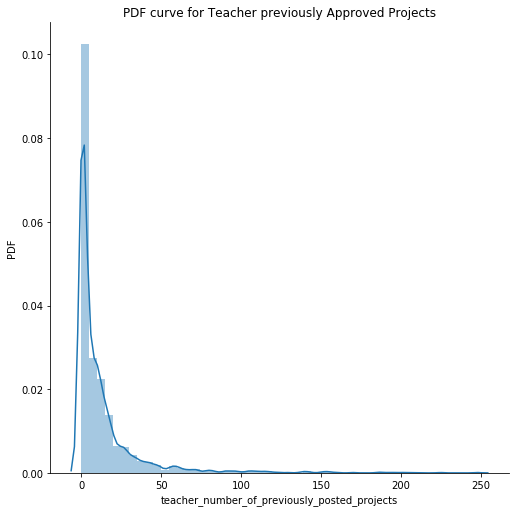

In [136]:
plt.figure(figsize=(7,10))
sns.FacetGrid(test_FP, height=7).map(sns.distplot, 'teacher_number_of_previously_posted_projects').add_legend()
plt.title('PDF curve for Teacher previously Approved Projects')
plt.ylabel('PDF')
plt.show()

## 3. Set -2

### 3.1 Merging all the features

In [0]:
from scipy.sparse import hstack
X_train_2 = hstack((X_train_Sstate, X_train_cat, X_train_subcat, X_train_grade, X_train_prefix, X_train_price, X_train_previous, 
                   X_train_essay_tfidf_w2v, X_train_title_tfidf_w2v)).tocsr()

X_test_2 = hstack((X_test_Sstate, X_test_cat, X_test_subcat, X_test_grade, X_test_prefix, X_test_price, X_test_previous,
                  X_test_essay_tfidf_w2v, X_test_title_tfidf_w2v)).tocsr()

In [108]:
print(X_train_2.shape)
print(X_test_2.shape)

(73196, 701)
(36052, 701)


### 3.2 Grid Search

In [100]:
classifier_2 = DecisionTreeClassifier()

In [103]:
from sklearn.model_selection import GridSearchCV
parameters = [
                { 
                    'max_depth' : [1, 5, 10, 50],
                    'min_samples_split' : [5, 10, 100, 500]
                }
            ]
grid_search_2 = GridSearchCV(estimator=classifier_2, param_grid=parameters, cv=2, scoring='roc_auc', n_jobs=-1, return_train_score=True)

In [104]:
grid_search_2 = grid_search_2.fit(X_train_2, y_train)

In [105]:
results = pd.DataFrame(grid_search_2.cv_results_)
results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,6.127482,0.004760,0.223565,0.001320,1,5,"{'max_depth': 1, 'min_samples_split': 5}",0.561591,0.545652,0.553621,0.007970,10,0.566398,0.548285,0.557342,0.009057
1,5.878965,0.017784,0.204471,0.005556,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.561591,0.545652,0.553621,0.007970,10,0.566398,0.548285,0.557342,0.009057
2,5.823848,0.027938,0.190958,0.007588,1,100,"{'max_depth': 1, 'min_samples_split': 100}",0.561591,0.545652,0.553621,0.007970,10,0.566398,0.548285,0.557342,0.009057
3,5.755458,0.009553,0.202005,0.008712,1,500,"{'max_depth': 1, 'min_samples_split': 500}",0.561591,0.545652,0.553621,0.007970,10,0.566398,0.548285,0.557342,0.009057
4,28.031199,0.437355,0.191036,0.011318,5,5,"{'max_depth': 5, 'min_samples_split': 5}",0.629721,0.626345,0.628033,0.001688,3,0.662035,0.661218,0.661626,0.000409


### 3.3 AUC vs Hyperparameter

In [106]:
min_split_2 = results['param_min_samples_split']
max_depth_2 = results['param_max_depth']
auc_train_2 = results['mean_train_score']
auc_test_2 = results['mean_test_score']

In [107]:
min_split_2 = min_split_2.to_list()
max_depth_2 = max_depth_2.to_list()
auc_test_2 = auc_test_2.to_list()
auc_train_2 = auc_train_2.to_list()

In [120]:
#To enable plotly plot in this cell
enable_plotly_in_cell() 

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=min_split_2, y=max_depth_2, z=auc_train_2, name='training')
trace2 = go.Scatter3d(x=min_split_2, y=max_depth_2, z=auc_test_2, name='Testing')
data = [trace1, trace2]

layout = go.Layout(
                    scene=dict(
                                xaxis = dict(title='Min Sample Split'),
                                yaxis = dict(title='Max Depth'),
                                zaxis = dict(title='AUC'),
                                )
                    )
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='3d-scatter-colorscale')

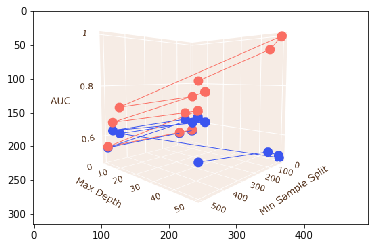

In [6]:
import matplotlib.pyplot as plt
import cv2
img_2 = cv2.imread(r'C:\Users\prem.k\Desktop\My projects\Assign\DT\plot_2.PNG')
plt.imshow(img_2)

In [110]:
best_depth_2 = grid_search_2.best_params_['max_depth']
best_min_split_2 = grid_search_2.best_params_['min_samples_split']
print('Best Depth :', best_depth_2)
print('Best Min split :', best_min_split_2)

Best Depth : 5
Best Min split : 10


### 3.4 Modelling with Parameters

In [110]:
from sklearn.tree import DecisionTreeClassifier
classifier_withParam_2 = DecisionTreeClassifier(max_depth=best_depth_2, min_samples_split=best_min_split_2)
classifier_withParam_2.fit(X_train_2, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### 3.5 Cross Validation

In [121]:
from sklearn.model_selection import cross_val_score
cv_2 = cross_val_score(estimator=classifier_withParam_2, X=X_train_2, y=y_train, cv=5, scoring='roc_auc')

In [122]:
best_auc_2 = cv_2.mean()
print('Best AUC: %4f' %best_auc_2)

Best AUC: 0.633984


### 3.6 HyperParameter vs AUC

In [0]:
def batch_predict(clf, data):
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])

    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
        
    return y_data_pred

In [0]:
y_train_predproba_2 = batch_predict(classifier_withParam_2, X_train_2)
y_test_predproba_2 = batch_predict(classifier_withParam_2, X_test_2)

In [0]:
from sklearn.metrics import roc_curve, auc
train_fpr_2, train_tpr_2, train_threshold_2 = roc_curve(y_train, y_train_predproba_2)
test_fpr_2, test_tpr_2, test_threshold_2 = roc_curve(y_test, y_test_predproba_2)

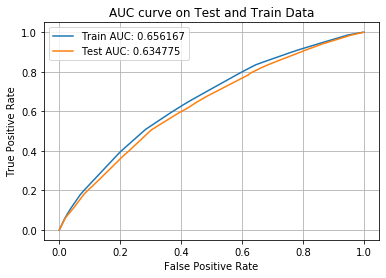

In [126]:
plt.plot(train_fpr_2, train_tpr_2, label='Train AUC: %4f' %auc(train_fpr_2, train_tpr_2))
plt.plot(test_fpr_2,  test_tpr_2, label='Test AUC: %4f' %auc(test_fpr_2, test_tpr_2))

plt.title('AUC curve on Test and Train Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.legend()
plt.show()

### 3.7 Confusion Matrix

In [0]:
def find_best_threshold(fpr, tpr, threshold):
    t = threshold[np.argmax(tpr*(1-fpr))]
    print('the maximum tpr*(1-fpr) is :', max(tpr*(1-fpr)), 'for threshold', np.round(t,3))
    return t

In [117]:
best_t = find_best_threshold(train_fpr_2, train_tpr_2, train_threshold_2)

the maximum tpr*(1-fpr) is : 0.36426626158572056 for threshold 1


In [0]:
def predict_with_threshold(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
            
    return predictions

In [0]:
y_train_pred_2 = predict_with_threshold(y_train_predproba_2, best_t)
y_test_pred_2 = predict_with_threshold(y_test_predproba_2, best_t)

In [0]:
from sklearn.metrics import confusion_matrix

cm_train_2 = confusion_matrix(y_train, y_train_pred_2)
cm_test_2 = confusion_matrix(y_test, y_test_pred_2)

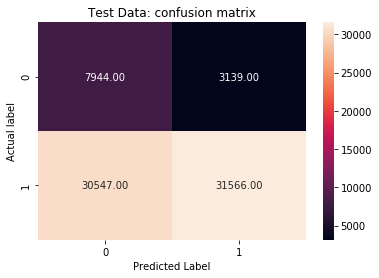

In [126]:
sns.heatmap(cm_train_2, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

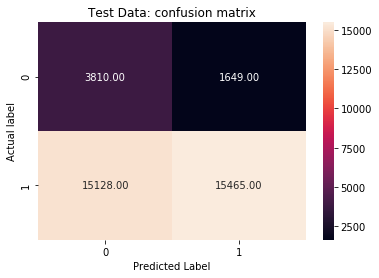

In [127]:
sns.heatmap(cm_test_2, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

### 3.8 Finding False Positive points on test data

In [0]:
y_test_pred_2 = (np.array(y_test_pred_2)).reshape(-1,1)

In [121]:
print(y_test.shape)
print(y_test_pred_2.shape)

(36052, 1)
(36052, 1)


In [0]:
#Getting the False positive points in test data
test_2_FP = data_test[(y_test_pred_2==1) & (y_test==0)]

In [123]:
test_2_FP.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
69487,69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,this is my ukulele dream,2,0.029133,5,124
78189,78189,fl,mrs,grades_prek_2,1,appliedlearning,earlydevelopment,i teacher low economic school all students fre...,84.32,warmth care hunger,19,0.190058,3,106


In [124]:
test_2_FP.shape

(1649, 14)

### 3.9 Word Cloud for False positive points on test data

In [0]:
comment_words_2 = ' '
stopwords = set(STOPWORDS)

In [0]:
for val in test_2_FP['essay']:
  val = str(val)
  tokens = val.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()

  for word in tokens:
    comment_words_2 = comment_words_2 + word + ' '

wordcloud_2 = WordCloud(width=800, height=800, background_color='white', stopwords=stopwords, min_font_size=10).generate(comment_words_2)

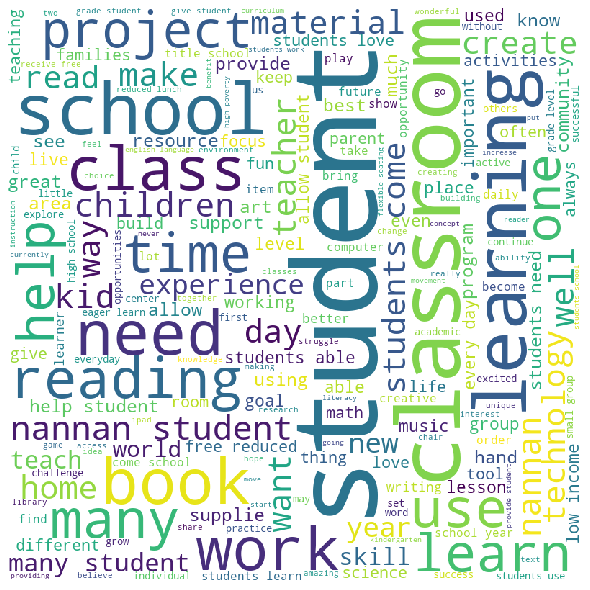

In [132]:
plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud_2)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### 3.10 Plot BoxPLot

Text(0.5, 1.0, 'Price on False Positive points')

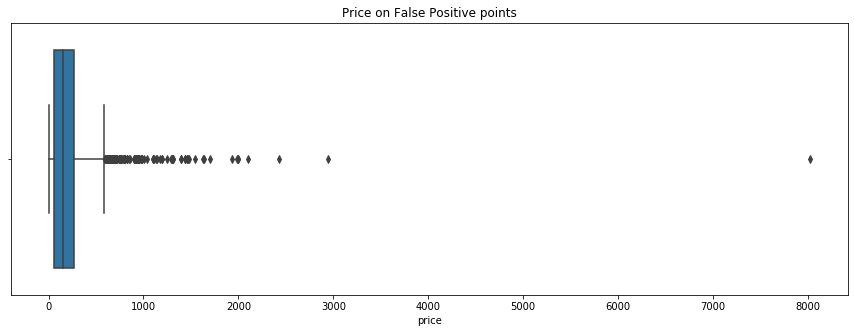

In [133]:
plt.figure(figsize=(15,5))
sns.boxplot(x='price',  data=test_2_FP)
plt.title('Price on False Positive points')

### 3.11 PDF plot for teacher_number_of_previously_posted_projects

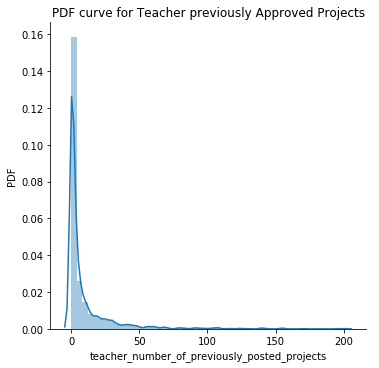

In [137]:
sns.FacetGrid(test_2_FP, height=5).map(sns.distplot, 'teacher_number_of_previously_posted_projects').add_legend()
plt.title('PDF curve for Teacher previously Approved Projects')
plt.ylabel('PDF')
plt.show()

## 4. Task -2

### 4.1 Getting Feature importance from Classifier_withParam_1

In [162]:
classifier_withParam_1.feature_importances_

array([0., 0., 0., ..., 0., 0., 0.])

In [163]:
(classifier_withParam_1.feature_importances_).shape

(7718,)

In [164]:
#finding the number of 0 in feature importance
(classifier_withParam_1.feature_importances_.tolist()).count(0)

7639

#### Note:
  - It shows that there totally 7639 0 values and remaining 79 are more than 0 and less than 1 values. So in order to find those 79 we need to find the threshold

In [0]:
#https://datascience.stackexchange.com/questions/64885/how-to-select-features-which-have-non-zero-importance-using-sklearns-decision-t
from sklearn.feature_selection import  SelectFromModel
from sklearn.tree import DecisionTreeClassifier
selector = SelectFromModel(estimator=DecisionTreeClassifier(max_depth=None)).fit(X_train_1,y_train)

In [157]:
selector.threshold_

0.0001295672454003628

It shows that the threshold we need to se it 0.000129

#### Note:
  - It shows that the 2264 features have values more than the threshold and we need to take all these 2264 features and model with it

In [0]:
classifier_1 = DecisionTreeClassifier(max_depth=None)

In [0]:
fearure_selector = SelectFromModel(estimator=classifier_1, threshold=0.000129)
X_train_1_FS = feature_selector.fit_transform(X_train_1, y_train)
X_test_1_FS = feature_selector.transform(X_test_1)

In [161]:
print(X_train_1_FS.shape)
print(X_test_1_FS.shape)

(73196, 78)
(36052, 78)


#### Note:
  - After applying the threshold it gives 78 features 

### 4.2 GridSearch

In [0]:
from sklearn.model_selection import GridSearchCV
parameters = [
                { 
                    'max_depth' : [1, 5, 10, 50],
                    'min_samples_split' : [5, 10, 100, 500]
                }
            ]
grid_search_FS = GridSearchCV(estimator=classifier_1, param_grid=parameters, cv=2, scoring='roc_auc', n_jobs=-1, return_train_score=True)

In [0]:
grid_search_FS = grid_search_FS.fit(X_train_1_FS, y_train)

In [169]:
results_FS = pd.DataFrame(grid_search_FS.cv_results_)
results_FS.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,0.036604,0.002568,0.016328,0.000140,1,5,"{'max_depth': 1, 'min_samples_split': 5}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
1,0.037730,0.001764,0.022386,0.002062,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
2,0.034574,0.002676,0.017531,0.000248,1,100,"{'max_depth': 1, 'min_samples_split': 100}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
3,0.038849,0.000136,0.017455,0.000465,1,500,"{'max_depth': 1, 'min_samples_split': 500}",0.561591,0.545652,0.553621,0.007970,13,0.566398,0.548285,0.557342,0.009057
4,0.130525,0.003277,0.019584,0.000169,5,5,"{'max_depth': 5, 'min_samples_split': 5}",0.617679,0.616267,0.616973,0.000706,9,0.631300,0.631029,0.631164,0.000135


In [170]:
best_depth_FS = grid_search_FS.best_params_['max_depth']
best_min_split_FS = grid_search_FS.best_params_['min_samples_split']
print('Best Depth :', best_depth_FS)
print('Best Min split :', best_min_split_FS)

Best Depth : 10
Best Min split : 500


### 4.3 AUC vs Hyperparameter

In [0]:
min_split_FS = results_FS['param_min_samples_split']
max_depth_FS = results_FS['param_max_depth']
auc_train_FS = results_FS['mean_train_score']
auc_test_FS = results_FS['mean_test_score']

In [175]:
#To enable plotly plot in this cell
enable_plotly_in_cell() 

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=min_split_FS, y=max_depth_FS, z=auc_train_FS, name='training')
trace2 = go.Scatter3d(x=min_split_FS, y=max_depth_FS, z=auc_test_FS, name='Testing')
data = [trace1, trace2]

layout = go.Layout(
                    scene=dict(
                                xaxis = dict(title='Min Sample Split'),
                                yaxis = dict(title='Max Depth'),
                                zaxis = dict(title='AUC'),
                                )
                    )
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='3d-scatter-colorscale')

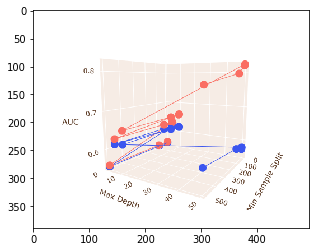

In [5]:
import matplotlib.pyplot as plt
import cv2
img_3 = cv2.imread(r'C:\Users\prem.k\Desktop\My projects\Assign\DT\plot_3.PNG')
plt.imshow(img_3)

### 4.4 Modelling with Parameters

In [177]:
from sklearn.tree import DecisionTreeClassifier
classifier_withParam_FS = DecisionTreeClassifier(max_depth=best_depth_FS, min_samples_split=best_min_split_FS)
classifier_withParam_FS.fit(X_train_1_FS, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### 4.5 Cross Validation

In [0]:
from sklearn.model_selection import cross_val_score
cv_FS = cross_val_score(estimator=classifier_withParam_FS, X=X_train_1_FS, y=y_train, cv=5, scoring='roc_auc')

In [179]:
best_auc_FS = cv_FS.mean()
print('Best AUC: %4f' %best_auc_FS)

Best AUC: 0.633717


### 4.6 ROC curve on train and test data

In [0]:
def batch_predict(clf, data):
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])

    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
        
    return y_data_pred

In [0]:
y_train_predproba_FS = batch_predict(classifier_withParam_FS, X_train_1_FS)
y_test_predproba_FS = batch_predict(classifier_withParam_FS, X_test_1_FS)

In [0]:
from sklearn.metrics import roc_curve, auc
train_fpr_FS, train_tpr_FS, train_threshold_FS = roc_curve(y_train, y_train_predproba_FS)
test_fpr_FS, test_tpr_FS, test_threshold_FS = roc_curve(y_test, y_test_predproba_FS)

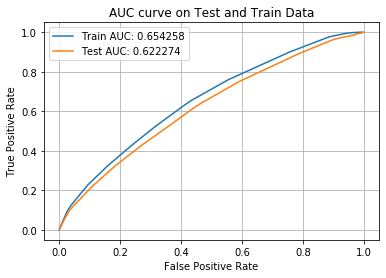

In [184]:
plt.plot(train_fpr_FS, train_tpr_FS, label='Train AUC: %4f' %auc(train_fpr_FS, train_tpr_FS))
plt.plot(test_fpr_FS,  test_tpr_FS, label='Test AUC: %4f' %auc(test_fpr_FS, test_tpr_FS))

plt.title('AUC curve on Test and Train Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid()
plt.legend()
plt.show()

### 4.7 Confusion Matrix

In [0]:
def find_best_threshold(fpr, tpr, threshold):
    t = threshold[np.argmax(tpr*(1-fpr))]
    print('the maximum tpr*(1-fpr) is :', max(tpr*(1-fpr)), 'for threshold', np.round(t,3))
    return t

In [186]:
best_t = find_best_threshold(train_fpr_FS, train_tpr_FS, train_threshold_FS)

the maximum tpr*(1-fpr) is : 0.3715603142057951 for threshold 0.864


In [0]:
def predict_with_threshold(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
            
    return predictions

In [0]:
y_train_pred_FS = predict_with_threshold(y_train_predproba_FS, best_t)
y_test_pred_FS = predict_with_threshold(y_test_predproba_FS, best_t)

In [0]:
from sklearn.metrics import confusion_matrix

cm_train_FS = confusion_matrix(y_train, y_train_pred_FS)
cm_test_FS = confusion_matrix(y_test, y_test_pred_FS)

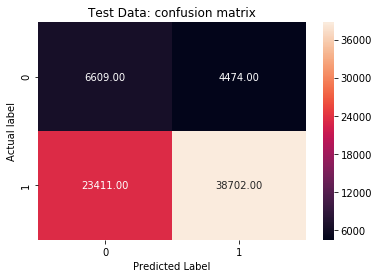

In [190]:
sns.heatmap(cm_train_FS, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

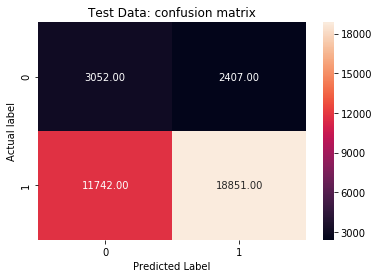

In [191]:
sns.heatmap(cm_test_FS, annot=True, fmt='.2f')
plt.title('Test Data: confusion matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual label')
plt.show()

### 4.8 Finding False positive points on test data

In [0]:
y_test_pred_FS = (np.array(y_test_pred_FS)).reshape(-1,1)

In [0]:
#Getting the False positive points in test data
test_FS_FP = data_test[(y_test_pred_FS==1) & (y_test==0)]

In [194]:
test_FS_FP.shape

(2407, 14)

In [195]:
test_FS_FP.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
69487,69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,this is my ukulele dream,2,0.029133,5,124
90598,90598,ca,mr,grades_3_5,2,literacy_language specialneeds,literacy specialneeds,my students diverse enthusiastic learners they...,175.98,technology everyone,8,0.376778,2,113


### 4.9 Plotting the Word cloud

In [0]:
comment_words_FS = ' '

In [0]:
for val in test_FS_FP['essay']:
  val = str(val)
  tokens = val.split()
  for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()

  for word in tokens:
    comment_words_2 = comment_words_2 + word + ' '

wordcloud_FS = WordCloud(width=800, height=800, background_color='white', stopwords=stopwords, min_font_size=10).generate(comment_words_2)

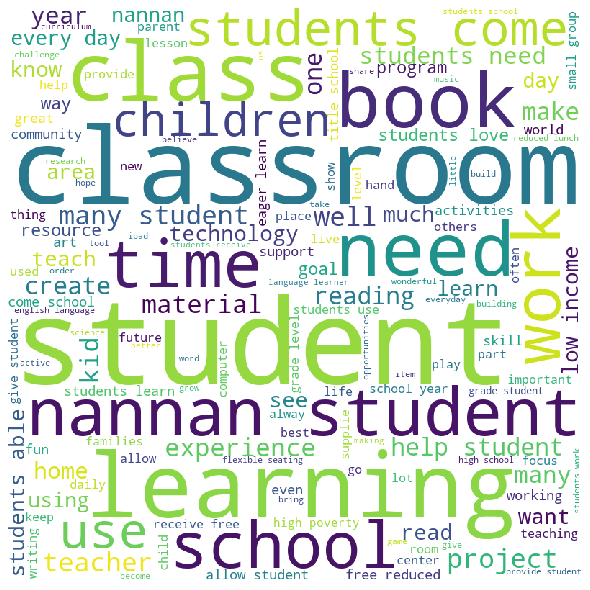

In [198]:
plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud_FS)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### 4.10 Box Plot of Price on False Positive points

Text(0.5, 1.0, 'Price on False Positive points')

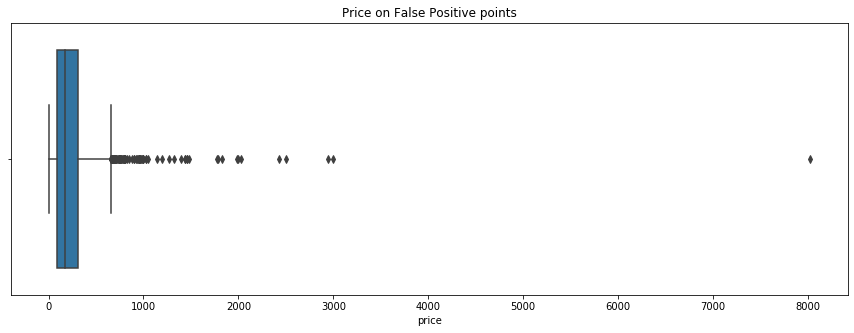

In [199]:
plt.figure(figsize=(15,5))
sns.boxplot(x='price',  data=test_FS_FP)
plt.title('Price on False Positive points')

### 4.11 PDF curve plot on Teacher Previous approved project

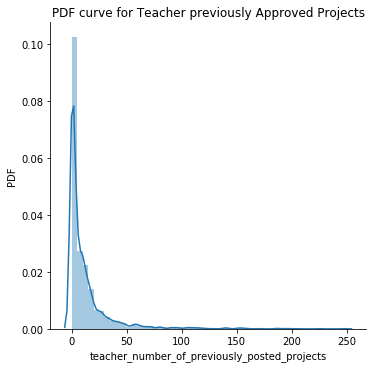

In [200]:
sns.FacetGrid(test_FS_FP, height=5).map(sns.distplot, 'teacher_number_of_previously_posted_projects').add_legend()
plt.title('PDF curve for Teacher previously Approved Projects')
plt.ylabel('PDF')
plt.show()

# Summary:

In [201]:
from prettytable import PrettyTable
x = PrettyTable()

x.field_names = ['Set Number', 'Vectorizer', 'Model', 'Hyperparameter: max_depth', 'Hyperparameter: min_samples_split', 'Best AUC']
x.add_row(['Set-1', 'TFIDF', 'Decision Tree', str(best_depth_1), str(best_penalty_1), str(best_auc_1)])
x.add_row(['Set-2', 'TFIDF-W2V', 'Decision Tree', str(best_depth_2), str(best_penalty_2), str(best_auc_2)])
x.add_row(['Set-3', 'TFIDF - Feature importance', 'Decision Tree', str(best_depth_FS), str(best_penalty_3), str(best_auc_3)])

print(x)

+------------+----------------------------+---------------+---------------------------+-----------------------------------+----------+
| Set Number |         Vectorizer         |     Model     | Hyperparameter: max_depth | Hyperparameter: min_samples_split | Best AUC |
+------------+----------------------------+---------------+---------------------------+-----------------------------------+----------+
|   Set-1    |           TFIDF            | Decision Tree |             10            |                500                | 0.62748  |
|   Set-2    |         TFIDF-W2V          | Decision Tree |             5             |                 10                | 0.63398  |
|   Set-3    | TFIDF - Feature importance | Decision Tree |             10            |                500                | 0.63371  |
+------------+----------------------------+---------------+---------------------------+-----------------------------------+----------+


# That's the end of the code